# <center>Временные ряды. <br> Неделя 3

<center> Глазунов А.В.


In [1]:
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [2]:
cd /content/gdrive/'My Drive'/Colab_Notebooks/ML_c6_TAXI

/content/gdrive/My Drive/Colab_Notebooks/ML_c6_TAXI


In [0]:
PATH_TO_DATA = 'data'

In [0]:
import warnings
warnings.filterwarnings('ignore')


from sklearn.base import BaseEstimator, TransformerMixin

import os
import pandas as pd
import numpy as np
from scipy import stats
from tqdm import tqdm_notebook
from matplotlib import pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")
import gc
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from itertools import product


In [0]:
def prepare_dataset_geo_time_series(taxi_data,reg_data):

  """  
  Описание

  Данная функция принимает на вход загруженные 
  таблицу с поездками и список зон с координатами

  Возвращает временной ряд частот поездок по времени 
  размера (time_length х regions_length)

  """
  df = taxi_data.copy()
  
  regions = reg_data.copy()

  #границы города, y - широта, x - долгота
  (Ymin,Ymax) = (regions.south.min(),regions.north.max())
  (Xmin,Xmax) = (regions.west.min(), regions.east.max())

  #очистка 
  df.drop(df[df.pickup_latitude <= Ymin].index,inplace =True )
  df.drop(df[df.pickup_latitude >= Ymax].index,inplace =True )
  df.drop(df[df.pickup_longitude <= Xmin].index,inplace =True )
  df.drop(df[df.pickup_longitude >= Xmax].index,inplace =True )
  df.drop(df[df.passenger_count == 0].index,inplace =True)
  df.drop(df[df.trip_distance == 0].index,inplace =True)
  df.drop(df[df.tpep_pickup_datetime == df.tpep_dropoff_datetime].index,inplace =True)

  #столбец времени по часам для построения ряда по часам
  df['time'] = df.tpep_pickup_datetime.apply(lambda x: x[:-6])

  #построение таблицы со строками - часами, столбцами - зонами, 
  #на пересечении - количество поездок в данный час из данной зоны
  binx = sorted(list(regions.west.unique()) + [regions.east.max()])
  biny = sorted(list(regions.south.unique()) + [regions.north.max()])

  hour_counts = []
  time = []
  for (tt,sub_df) in tqdm_notebook(df.groupby('time')):
    x = sub_df.pickup_longitude
    y = sub_df.pickup_latitude

    res = stats.binned_statistic_2d(x,y,x, statistic = 'count', bins = [binx,biny])
    counts = res.statistic.reshape(-1)    

    time.append(pd.to_datetime(tt))
    hour_counts.append(counts)

    
  #датафрейм-результат, отсортированный по времени в формате datetime
  
  time_series = pd.DataFrame(hour_counts,index = time,columns = list(regions.region),dtype=int)
  time_series.sort_index(inplace=True)

  return time_series

In [6]:
%%time
regions = pd.read_csv(os.path.join(PATH_TO_DATA,'regions.csv'),sep=';')

CPU times: user 5.67 ms, sys: 4.09 ms, total: 9.77 ms
Wall time: 874 ms


In [7]:
regions.head()

,region,west,east,south,north
0,1,-74.25559,-74.244478,40.496120,40.504508
1,2,-74.25559,-74.244478,40.504508,40.512896
2,3,-74.25559,-74.244478,40.512896,40.521285
3,4,-74.25559,-74.244478,40.521285,40.529673
4,5,-74.25559,-74.244478,40.529673,40.538061


In [9]:
'''
%%time

months = ['2015-12','2016-01','2016-02','2016-03','2016-04','2016-05']
time_series_tables = []

for month in months:
  df = pd.read_csv(os.path.join(PATH_TO_DATA,f'yellow_tripdata_{month}.csv')) 
  time_series_table = prepare_dataset_geo_time_series(df,regions)

  gc.collect()
  
  time_series_tables.append(time_series_table)

  
del df
time_series_6_month = pd.concat(time_series_tables)
#time_series_6_month.to_csv('time_series_6_month.csv')
'''

"\n%%time\n\nmonths = ['2015-12','2016-01','2016-02','2016-03','2016-04','2016-05']\ntime_series_tables = []\n\nfor month in months:\n  df = pd.read_csv(os.path.join(PATH_TO_DATA,f'yellow_tripdata_{month}.csv')) \n  time_series_table = prepare_dataset_geo_time_series(df,regions)\n\n  gc.collect()\n  \n  time_series_tables.append(time_series_table)\n\n  \ndel df\ntime_series_6_month = pd.concat(time_series_tables)\n#time_series_6_month.to_csv('time_series_6_month.csv')\n"

Загрузим данные за 6 месяцев

In [10]:
%%time
time_series_6_month = pd.read_csv(os.path.join(PATH_TO_DATA,'time_series_6_month.csv'),index_col=0)


CPU times: user 1.17 s, sys: 220 ms, total: 1.39 s
Wall time: 2.1 s


In [11]:
%%time
time_series_6_month.columns = range(1,2501)
dt = [pd.to_datetime(tt) for tt in list(time_series_6_month.index)]
time_series_6_month.index = dt

CPU times: user 496 ms, sys: 0 ns, total: 496 ms
Wall time: 497 ms


In [12]:
time_series_6_month.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,...,2461,2462,2463,2464,2465,2466,2467,2468,2469,2470,2471,2472,2473,2474,2475,2476,2477,2478,2479,2480,2481,2482,2483,2484,2485,2486,2487,2488,2489,2490,2491,2492,2493,2494,2495,2496,2497,2498,2499,2500
2015-12-01 00:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2015-12-01 01:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2015-12-01 02:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2015-12-01 03:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2015-12-01 04:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [13]:
time_series_6_month.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4392 entries, 2015-12-01 00:00:00 to 2016-05-31 23:00:00
Columns: 2500 entries, 1 to 2500
dtypes: int64(2500)
memory usage: 83.8 MB


Будем рассматривать зону, где расположено Empire State Building

      region       west     east      south      north
1230    1231 -73.988912 -73.9778  40.747766  40.756154


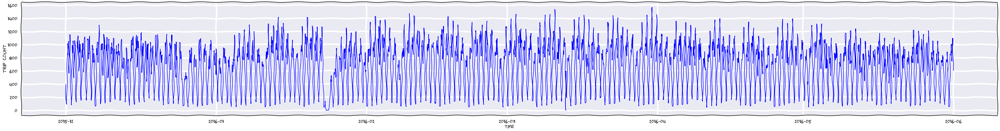

In [14]:
ESB_lat = 40.748817
ESB_long = -73.985428
print(regions[regions.south<ESB_lat][regions.north>ESB_lat][regions.west < ESB_long][regions.east > ESB_long])
ESN_reg=1231
ESB_ts = time_series_6_month[ESN_reg]
with plt.xkcd():
  plt.figure(figsize=(50,6))
  plt.plot(ESB_ts, color = 'blue',linewidth = 1.5)
  plt.grid(True)
  plt.xlabel('time')
  plt.ylabel('trip count')

Посмотрим на результаты stl декомпозиции для фрагмента ряда

Критерий Дики-Фуллера: p=0.000000


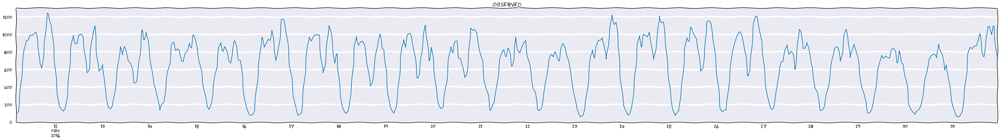

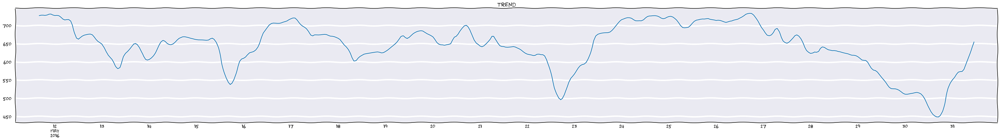

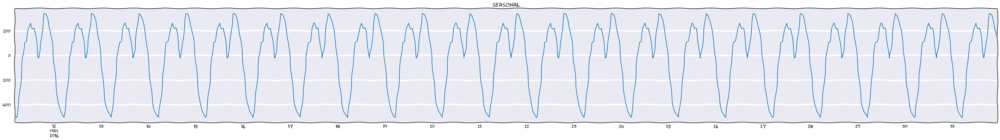

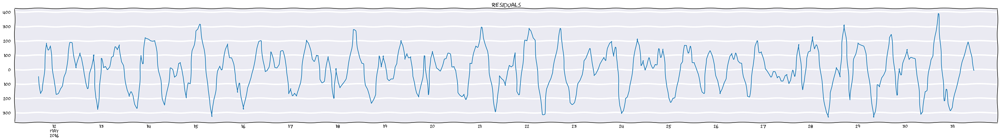

In [15]:
def stl_plot(ts):
  with plt.xkcd():  
    result = sm.tsa.seasonal_decompose(ts)
    plt.figure(figsize=(50,6))
    result.observed.plot(title = 'observed')
    plt.grid(True)

    plt.figure(figsize=(50,6)) 
    result.trend.plot(title = 'trend')
    plt.grid(True)

    plt.figure(figsize=(50,6)) 
    result.seasonal.plot(title = 'seasonal')
    plt.grid(True)
  
    plt.figure(figsize=(50,6)) 
    result.resid.plot(title = 'residuals')
    plt.grid(True)

stl_plot(ESB_ts[-500:])  
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(ESB_ts)[1])

На графике тренда видна недельная сезонность, на графике сезонности видна суточная сезонность. Зададим регрессионные признаки, чтобы описать недельную сезонность

In [0]:
def reg_feats(start,stop,kw=2,ky=0,linear_fe=False):
    #Вспомогательная функция для построения признаков
    
    arg = np.array([x for x in range(start,stop+1)])
    fe_list = []
    columns = []

    #Линейный признак для описания простейшего тренда
    if linear_fe:
      fe_list.append(arg) 
      columns.append('t')

    #Признаки для описания недельной сезонности
    for i in range(1,kw+1):
      fe_list.append(np.sin(arg*2*np.pi*i/168))
      columns.append(f'sin(2*pi*t*{i}/168)')
      fe_list.append(np.cos(arg*2*np.pi*i/168))
      columns.append(f'cos(2*pi*t*{i}/168)')
  
    #Признаки для описания годовой сезонности
    for j in range(1,ky+1):
      fe_list.append(np.sin(arg*2*np.pi*j/8766))
      columns.append(f'sin(2*pi*t*{j}/8766)')
      fe_list.append(np.cos(arg*2*np.pi*i/8766))
      columns.append(f'cos(2*pi*t*{j}/8766)')

    df = pd.DataFrame(fe_list).T
    df.columns = columns
    return df

Возьмем количество регрессионных признаков 40 (kw=20) для описания недельной сезонности.

In [20]:
feats = reg_feats(1,ESB_ts.shape[0],kw=20,ky=5)
feats.head()

,sin(2*pi*t*1/168),cos(2*pi*t*1/168),sin(2*pi*t*2/168),cos(2*pi*t*2/168),sin(2*pi*t*3/168),cos(2*pi*t*3/168),sin(2*pi*t*4/168),cos(2*pi*t*4/168),sin(2*pi*t*5/168),cos(2*pi*t*5/168),sin(2*pi*t*6/168),cos(2*pi*t*6/168),sin(2*pi*t*7/168),cos(2*pi*t*7/168),sin(2*pi*t*8/168),cos(2*pi*t*8/168),sin(2*pi*t*9/168),cos(2*pi*t*9/168),sin(2*pi*t*10/168),cos(2*pi*t*10/168),sin(2*pi*t*11/168),cos(2*pi*t*11/168),sin(2*pi*t*12/168),cos(2*pi*t*12/168),sin(2*pi*t*13/168),cos(2*pi*t*13/168),sin(2*pi*t*14/168),cos(2*pi*t*14/168),sin(2*pi*t*15/168),cos(2*pi*t*15/168),sin(2*pi*t*16/168),cos(2*pi*t*16/168),sin(2*pi*t*17/168),cos(2*pi*t*17/168),sin(2*pi*t*18/168),cos(2*pi*t*18/168),sin(2*pi*t*19/168),cos(2*pi*t*19/168),sin(2*pi*t*20/168),cos(2*pi*t*20/168),sin(2*pi*t*1/8766),cos(2*pi*t*1/8766),sin(2*pi*t*2/8766),cos(2*pi*t*2/8766),sin(2*pi*t*3/8766),cos(2*pi*t*3/8766),sin(2*pi*t*4/8766),cos(2*pi*t*4/8766),sin(2*pi*t*5/8766),cos(2*pi*t*5/8766)
0,0.037391,0.999301,0.074730,0.997204,0.111964,0.993712,0.149042,0.988831,0.185912,0.982566,0.222521,0.974928,0.258819,0.965926,0.294755,0.955573,0.330279,0.943883,0.365341,0.930874,0.399892,0.916562,0.433884,0.900969,0.467269,0.884115,0.500000,8.660254e-01,0.532032,0.846724,0.563320,0.826239,0.593820,0.804598,0.623490,0.781831,0.652287,0.757972,0.680173,0.733052,0.000717,0.999897,0.001434,0.999897,0.002150,0.999897,0.002867,0.999897,0.003584,0.999897
1,0.074730,0.997204,0.149042,0.988831,0.222521,0.974928,0.294755,0.955573,0.365341,0.930874,0.433884,0.900969,0.500000,0.866025,0.563320,0.826239,0.623490,0.781831,0.680173,0.733052,0.733052,0.680173,0.781831,0.623490,0.826239,0.563320,0.866025,5.000000e-01,0.900969,0.433884,0.930874,0.365341,0.955573,0.294755,0.974928,0.222521,0.988831,0.149042,0.997204,0.074730,0.001434,0.999589,0.002867,0.999589,0.004301,0.999589,0.005734,0.999589,0.007168,0.999589
2,0.111964,0.993712,0.222521,0.974928,0.330279,0.943883,0.433884,0.900969,0.532032,0.846724,0.623490,0.781831,0.707107,0.707107,0.781831,0.623490,0.846724,0.532032,0.900969,0.433884,0.943883,0.330279,0.974928,0.222521,0.993712,0.111964,1.000000,6.123234e-17,0.993712,-0.111964,0.974928,-0.222521,0.943883,-0.330279,0.900969,-0.433884,0.846724,-0.532032,0.781831,-0.623490,0.002150,0.999075,0.004301,0.999075,0.006451,0.999075,0.008601,0.999075,0.010751,0.999075
3,0.149042,0.988831,0.294755,0.955573,0.433884,0.900969,0.563320,0.826239,0.680173,0.733052,0.781831,0.623490,0.866025,0.500000,0.930874,0.365341,0.974928,0.222521,0.997204,0.074730,0.997204,-0.074730,0.974928,-0.222521,0.930874,-0.365341,0.866025,-5.000000e-01,0.781831,-0.623490,0.680173,-0.733052,0.563320,-0.826239,0.433884,-0.900969,0.294755,-0.955573,0.149042,-0.988831,0.002867,0.998356,0.005734,0.998356,0.008601,0.998356,0.011468,0.998356,0.014335,0.998356
4,0.185912,0.982566,0.365341,0.930874,0.532032,0.846724,0.680173,0.733052,0.804598,0.593820,0.900969,0.433884,0.965926,0.258819,0.997204,0.074730,0.993712,-0.111964,0.955573,-0.294755,0.884115,-0.467269,0.781831,-0.623490,0.652287,-0.757972,0.500000,-8.660254e-01,0.330279,-0.943883,0.149042,-0.988831,-0.037391,-0.999301,-0.222521,-0.974928,-0.399892,-0.916562,-0.563320,-0.826239,0.003584,0.997432,0.007168,0.997432,0.010751,0.997432,0.014335,0.997432,0.017918,0.997432


Построим линейную регрессию и будем анализировать остатки.

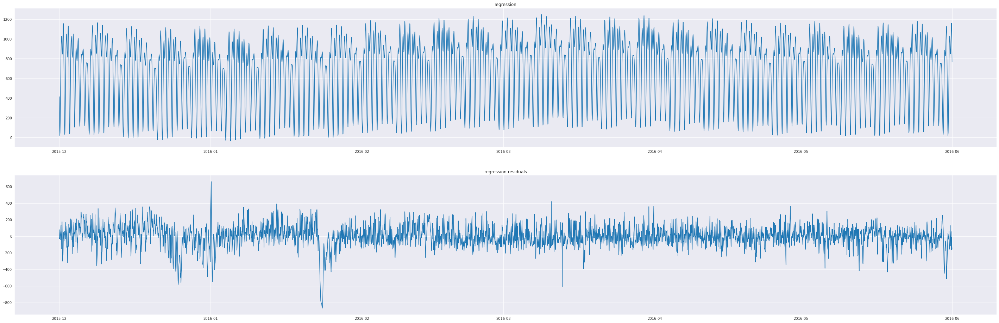

In [21]:
regressor = LinearRegression()
regressor.fit(feats,ESB_ts)
preds = regressor.predict(feats)
plt.figure(figsize=(50,16))
ax=plt.subplot(211)
ax.plot(ESB_ts.index,preds)
plt.title('regression');

resids = ESB_ts - preds
ax=plt.subplot(212)
ax.plot(resids)
plt.title('regression residuals');


In [0]:
ts_df = resids.to_frame(name="resids")

Критерий Дики-Фуллера: p=0.000000


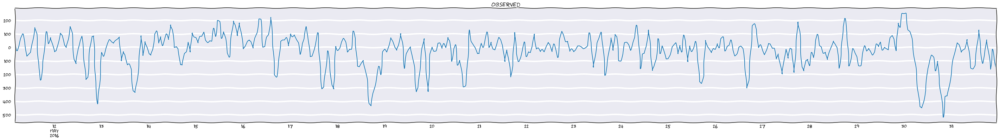

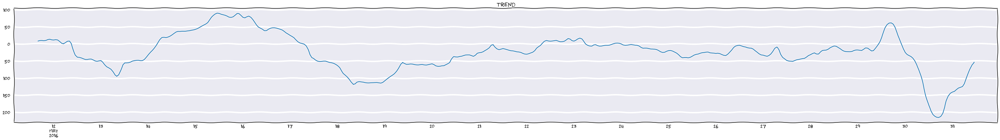

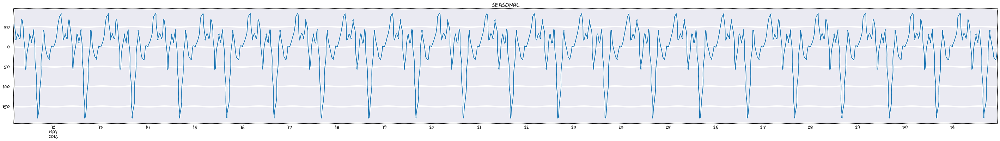

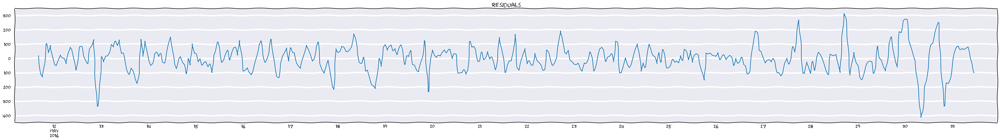

In [23]:
stl_plot(ts_df.resids[-500:])  
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(resids)[1])

В остатках видны тренды и суточная сезонность, при этом недельная сезонность почти устранена

Критерий Дики-Фуллера: p=0.000000


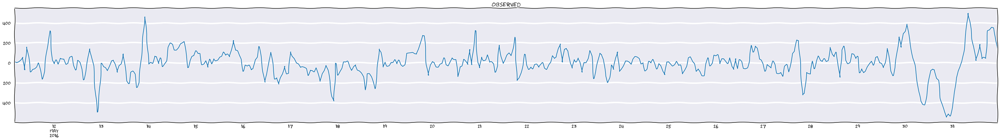

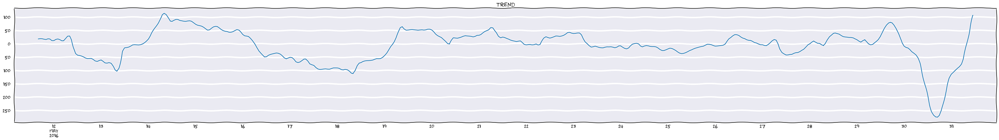

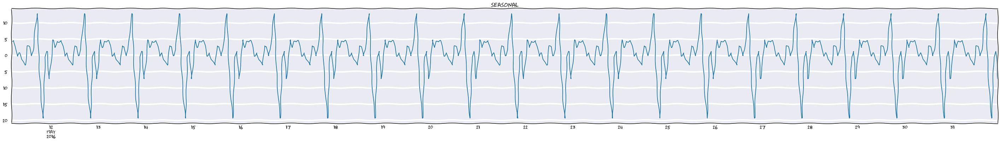

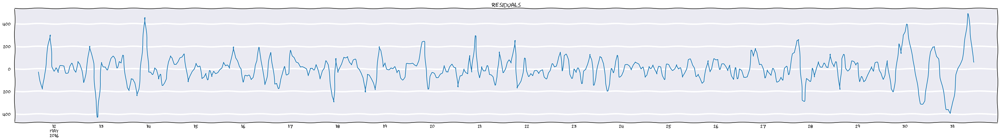

In [25]:
ts_df['diff1_resids'] = ts_df.resids - ts_df.resids.shift(24)

stl_plot(ts_df.diff1_resids[-500:])  
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(ts_df.diff1_resids[25:] )[1])

Критерий Дики-Фуллера: p=0.000000


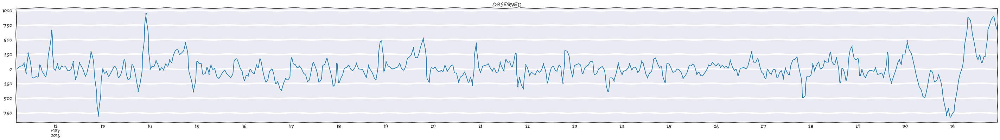

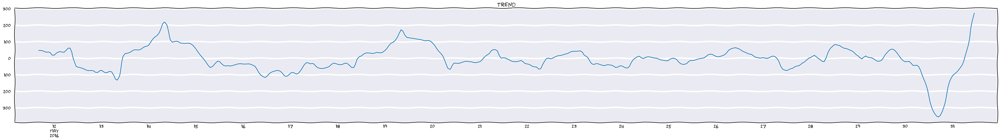

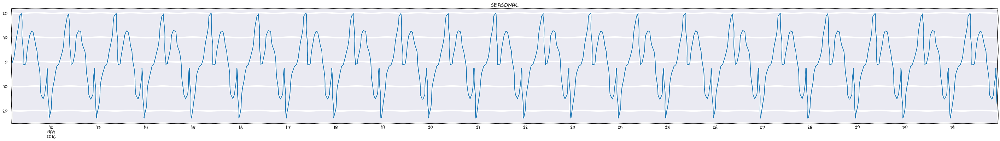

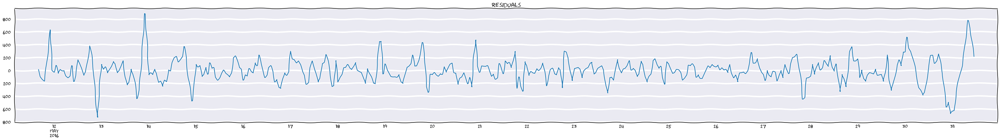

In [26]:
ts_df['diff2_resids'] = ts_df.diff1_resids - ts_df.diff1_resids.shift(24)

stl_plot(ts_df.diff2_resids[-500:])  
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(ts_df.diff2_resids[49:] )[1])


Критерий Дики-Фуллера: p=0.000000


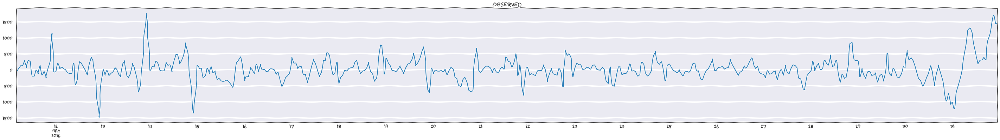

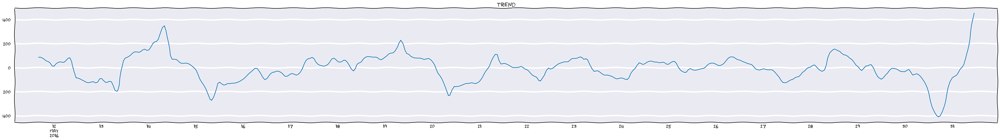

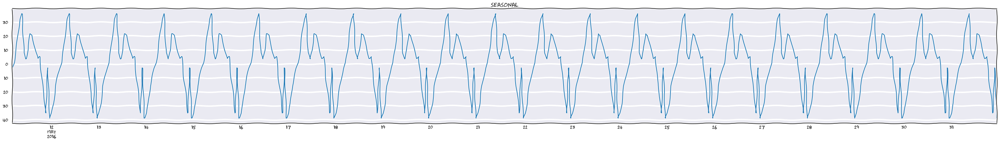

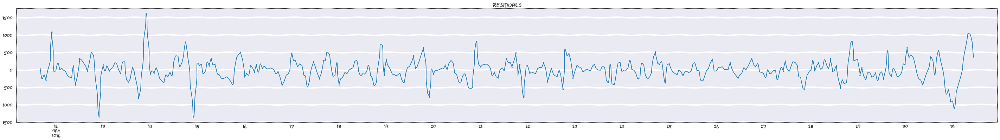

In [30]:
ts_df['diff3_resids'] = ts_df.diff2_resids - ts_df.diff2_resids.shift(24)

stl_plot(ts_df.diff3_resids[-500:])  
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(ts_df.diff3_resids[73:] )[1])


Критерий Дики-Фуллера: p=0.000000


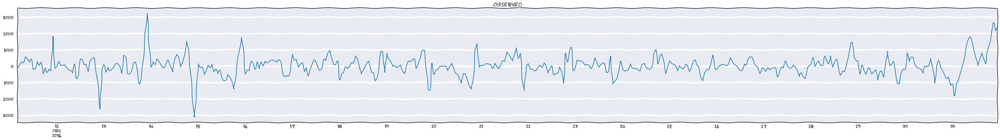

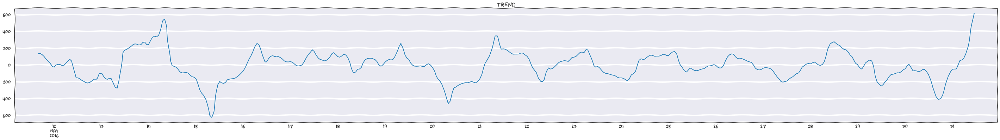

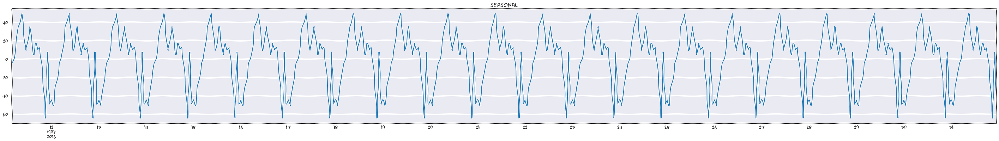

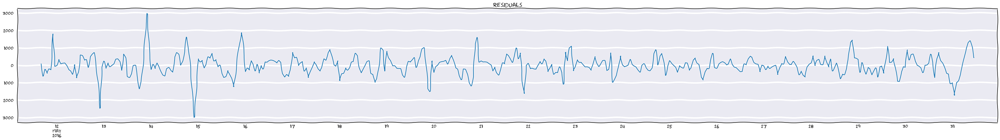

In [31]:
ts_df['diff4_resids'] = ts_df.diff3_resids - ts_df.diff3_resids.shift(24)

stl_plot(ts_df.diff4_resids[-500:])  
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(ts_df.diff4_resids[100:])[1])

Критерий Дики-Фуллера: p=0.000000


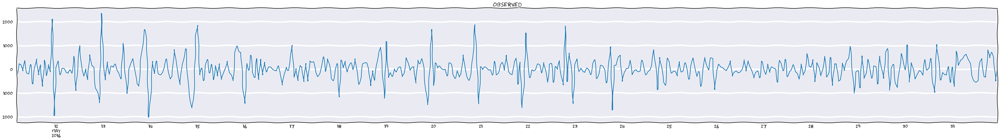

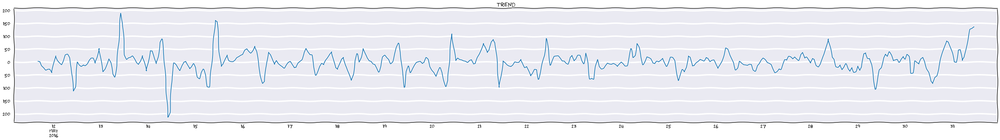

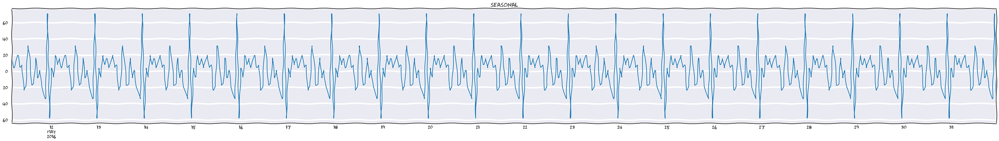

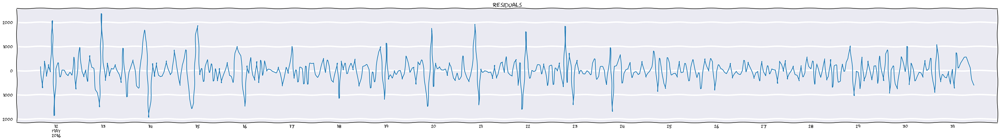

In [32]:
ts_df['diff5_resids'] = ts_df.diff4_resids - ts_df.diff4_resids.shift(1)

stl_plot(ts_df.diff5_resids[-500:])  
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(ts_df.diff5_resids[101:])[1])

Видно, что после 1 сезонного дифференцирования сезонная компонента в остатках регрессии имеет небольшую амплитуду (размах около 30). Остальные дифференцирования результат не улучшили, поскольку растет амплитуда сезонности. Можно, конечно, возразить, что уменьшается выраженность трендов, но данный факт можно проверить при дальнейшем подборе в рамках проекта. Пока остановимся на 1 сезонном дифференцировании.

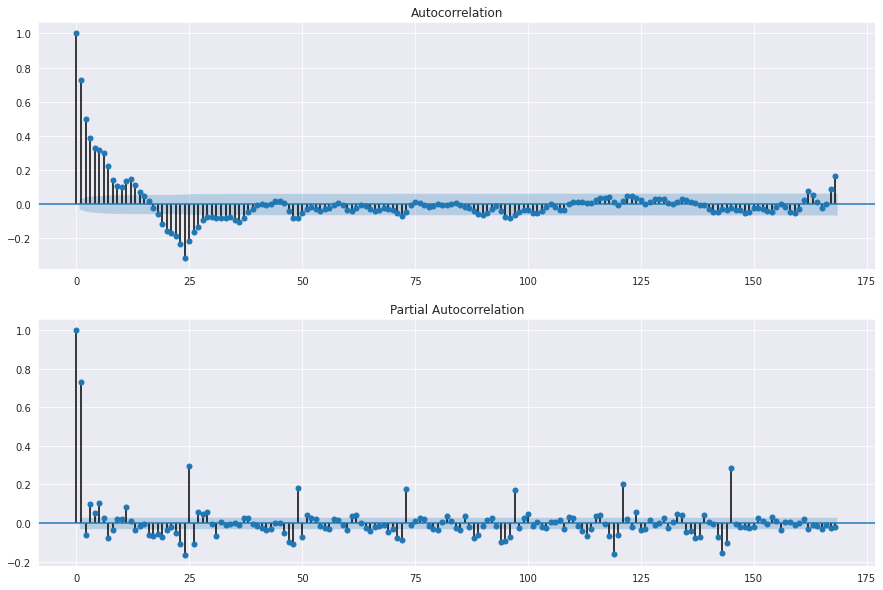

In [40]:
plt.figure(figsize=(15,10))
ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(ts_df.diff1_resids[25:].values.squeeze(), lags=168, ax=ax);

ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(ts_df.diff1_resids[25:].values.squeeze(), lags=168, ax=ax);


Возможные параметры Q=1,q=3,P=1,p=1(из-за вычислительных возможностей будем брать лаги с корреляцией около 0.4 для обычных компонент и 0.2 для сезонных)

In [0]:
ps = range(0, 2)
d=0
qs = range(0, 4)
Ps = range(0, 2)
D=1
Qs = range(0, 2)

In [44]:
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

32

Для быстрого подбора модели напишем класс для моделей с интерфейсом fit predict

In [0]:
class TimeSeriesModel(BaseEstimator, TransformerMixin):
  '''
  Модель для предсказания временного ряда.
  Использует регрессию на тригонометрические признаки и модель SARIMA
  '''

  def __init__(self,kw=2,ky=0,linear_fe=False,params=(1,1,1),seasonal_params=(1,1,1,24)):
    self.kw = 2
    self.ky = ky
    self.linear_fe = linear_fe
    self.params=params
    self.seasonal_params=seasonal_params
    

  def reg_feats(self,start,stop,kw=2,ky=0,linear_fe=False):
    #Вспомогательная функция для построения признаков
    
    arg = np.array([x for x in range(start,stop+1)])
    fe_list = []
    columns = []

    #Линейный признак для описания простейшего тренда
    if linear_fe:
      fe_list.append(arg) 
      columns.append('t')

    #Признаки для описания недельной сезонности
    for i in range(1,kw+1):
      fe_list.append(np.sin(arg*2*np.pi*i/168))
      columns.append(f'sin(2*pi*t*{i}/168)')
      fe_list.append(np.cos(arg*2*np.pi*i/168))
      columns.append(f'cos(2*pi*t*{i}/168)')
  
    #Признаки для описания годовой сезонности
    for j in range(1,ky+1):
      fe_list.append(np.sin(arg*2*np.pi*j/8766))
      columns.append(f'sin(2*pi*t*{j}/8766)')
      fe_list.append(np.cos(arg*2*np.pi*i/8766))
      columns.append(f'cos(2*pi*t*{j}/8766)')

    df = pd.DataFrame(fe_list).T
    df.columns = columns
    return df

  def fit(self,ts):
    self.ts = ts
    #Признаки для регрессии
    feats = self.reg_feats(start=1,stop=self.ts.shape[0],kw=self.kw, ky=self.ky,linear_fe=self.linear_fe)
    self.regressor = LinearRegression()
    self.regressor.fit(feats,self.ts)
    preds = self.regressor.predict(feats)
    #Получаем остатки регрессии и обучаем на них SARIMA
    resids = self.ts - preds
    self.model=sm.tsa.statespace.SARIMAX(resids.values, order=self.params, 
                                        seasonal_order=self.seasonal_params).fit(disp=-1)
    return self
    

  def predict(self,start,stop,verbose=False):
    #Получаем признаки регрессии для предсказания 
    feats = self.reg_feats(start,stop,self.kw,self.ky,self.linear_fe) 
    #Предсказание регрессии
    pred_regression = self.regressor.predict(feats)
    #Предсказание SARIMA
    pred_resids = self.model.predict(start=start, end=stop)
    #Итоговое предсказание как суперпозиция
    result = pred_resids + pred_regression
    
    if verbose:
      plt.plot(pred_regression,color='r') #график регрессии для отладки
      plt.plot(pred_resids,color='g')#график предсказанных остатков для отладки


    return result   


Опробуем модель на простых параметрах

In [0]:
model = TimeSeriesModel(kw=2,ky=0,linear_fe=False,params=(0,0,1),seasonal_params=(1,1,1,24))

In [49]:
%%time
model.fit(ESB_ts)
prediction = model.predict(ESB_ts.shape[0]-500,ESB_ts.shape[0]-1)

CPU times: user 1min 34s, sys: 24.8 s, total: 1min 59s
Wall time: 1min 27s


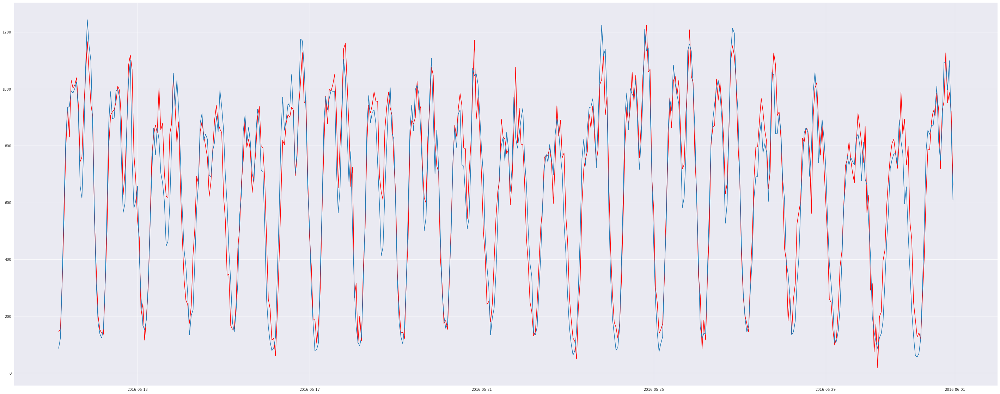

In [50]:
plt.figure(figsize=(50,20))
plt.plot(ESB_ts[-500:].index,prediction,color='r')
plt.plot(ESB_ts[-500:].index,ESB_ts[-500:].values);

Можно увидеть, что даже простая модель описывает сложную сезонность в обучающих данных, при этом на тесте, естесственно такого не будет. Сравним результаты разработанной модели и предложенной SARIMAX с регрессионными признаками.

In [51]:
%%time
model2=sm.tsa.statespace.SARIMAX(ESB_ts.values, exog=model.reg_feats(1,ESB_ts.shape[0],kw=2,ky=0,linear_fe=False), order=(0, 0, 1), 
                                        seasonal_order=(1, 1, 1, 24)).fit(disp=-1)

CPU times: user 3min 8s, sys: 44.3 s, total: 3min 52s
Wall time: 2min 53s


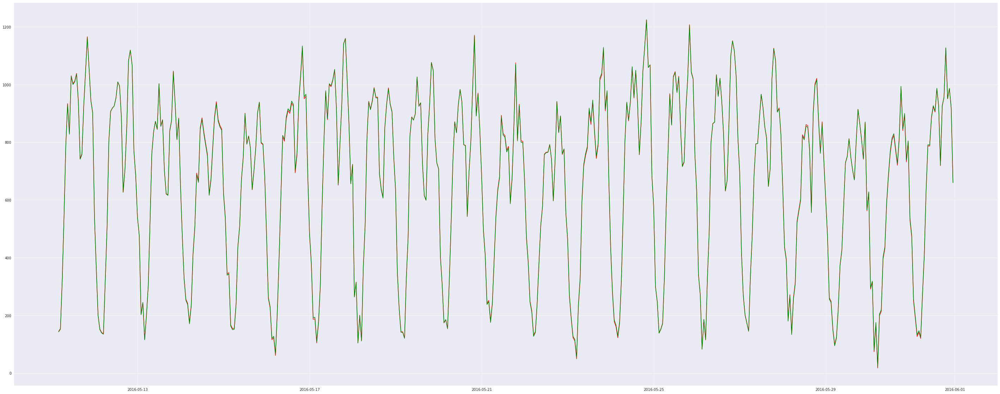

In [60]:
prediction2 = model2.fittedvalues[-500:]
plt.figure(figsize=(50,20))
plt.plot(ESB_ts[-500:].index,prediction,color='r')
plt.plot(ESB_ts[-500:].index,prediction2,color='g');

Можно заместить, что даже при такой простой постановке написанный класс эффективней предложенной модели в 2 раза, при этом, как видно из последнего графика, предсказанные величины практически идентичны. Поэтому будем далее использовать разработанную модель. Также для простоты при подборе будет рассмотривать не весь ряд, а только 720 последних часов.

In [63]:
%%time
results = []
best_aic = float("inf")
warnings.filterwarnings('ignore')

for param in tqdm_notebook(parameters_list):
    #try except нужен, потому что на некоторых наборах параметров модель не обучается
    try:
        model = TimeSeriesModel(kw=20,ky=0,linear_fe=False,params=(param[0], d, param[1]),seasonal_params=(param[2], D, param[3], 24))
        model.fit(ESB_ts[-720:])
    #выводим параметры, на которых модель не обучается и переходим к следующему набору
    except ValueError:
        print('wrong parameters:', param)
        continue
    aic = model.model.aic
    #сохраняем лучшую модель, aic, параметры
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results.append([param, model.model.aic])
    
warnings.filterwarnings('default')


CPU times: user 14min 45s, sys: 5min 47s, total: 20min 32s
Wall time: 10min 28s


In [68]:
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by = 'aic', ascending=True).head())

      parameters          aic
31  (1, 3, 1, 1)  8074.712762
27  (1, 2, 1, 1)  8079.965237
23  (1, 1, 1, 1)  8090.455497
15  (0, 3, 1, 1)  8110.678736
29  (1, 3, 0, 1)  8146.912004


Обучим модель на данных за 5 месяцев, при этом последние 720 часов используем для валидации

In [0]:
model = TimeSeriesModel(kw=20,ky=0,linear_fe=False,params=(1,0,3),seasonal_params=(1,1,1,24))

In [75]:
%%time
model.fit(ESB_ts[:-720])
print(model.model.summary())

                                 Statespace Model Results                                 
Dep. Variable:                                  y   No. Observations:                 3672
Model:             SARIMAX(1, 0, 3)x(1, 1, 1, 24)   Log Likelihood              -21376.758
Date:                            Tue, 12 May 2020   AIC                          42767.515
Time:                                    11:46:41   BIC                          42810.929
Sample:                                         0   HQIC                         42782.977
                                           - 3672                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6512      0.022     29.895      0.000       0.609       0.694
ma.L1          0.4032      0.024   

Посмотрим на точность на обучающих данных (последние 720 часов обучения)

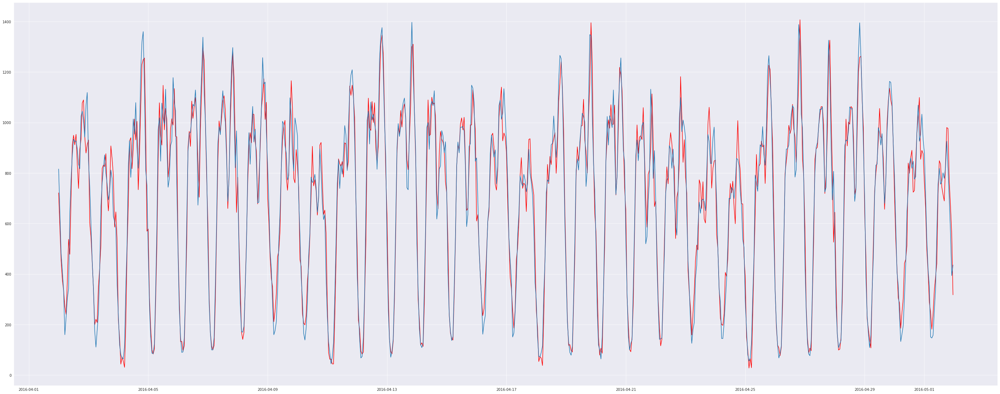

In [100]:
prediction0=model.predict(ESB_ts.shape[0]-1440,ESB_ts.shape[0]-721)
plt.figure(figsize=(50,20))
plt.plot(ESB_ts[-1440:-720].index,prediction0,color='r')
plt.plot(ESB_ts[-1440:-720].index,ESB_ts[-1440:-720].values);

Видно, что в целом модель описывает данные, при этом есть сложности с описанием отдельных пиков и впадин, которые, скорее всего, можно объяснить аномалиями.

Посмотрим на остатки SARIMA

Критерий Стьюдента: p=0.048004
Критерий Дики-Фуллера: p=0.000000


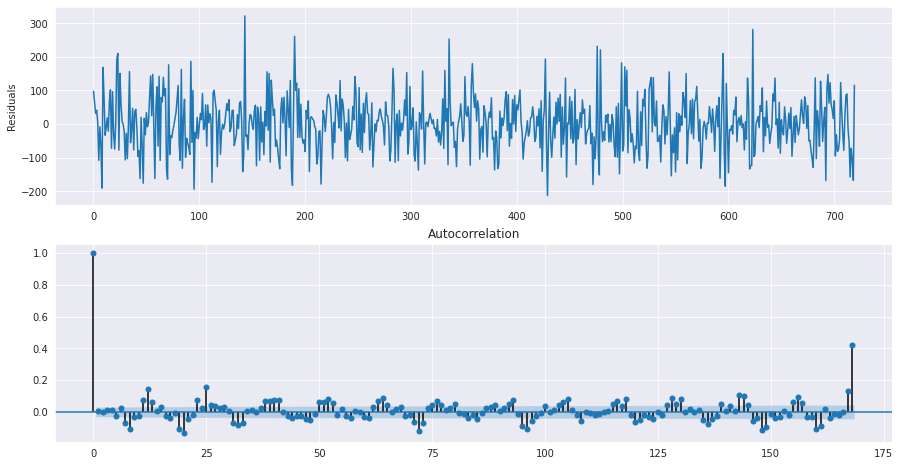

In [84]:
plt.figure(figsize=(15,8))
ax = plt.subplot(211)
ax.plot(model.model.resid[-720:])
plt.ylabel(u'Residuals')

ax = plt.subplot(212)
sm.graphics.tsa.plot_acf(model.model.resid[25:].squeeze(), lags=168, ax=ax)

print("Критерий Стьюдента: p=%f" % stats.ttest_1samp(model.model.resid[25:], 0)[1])
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(model.model.resid[25:])[1])

Остатки напоминают визуально белый шум. Уровень значимости для теста Стьюдента имеет пограничное значение, можно считать, что в первом приближении остатки несмещены. Критерий Льюнга-Бокса и коррелограмма говорят о слабой автокорреливанности ряда. Критерий Дики-Фуллера отвергает гипотезу о нестационарности, но, в связи с большим количеством данных, стоит посмотреть на stl декомпозицию ряда остатков. При этом нужно учитывать, что при больших данных аппарат проверки гипотез склонен отклонять нулевые гипотезы в пользу альтернатив.

/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)


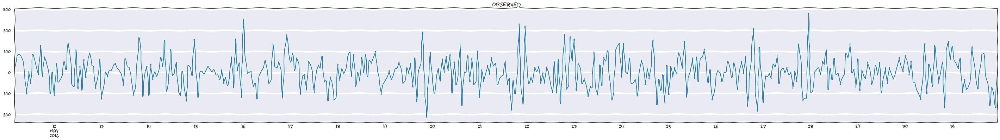

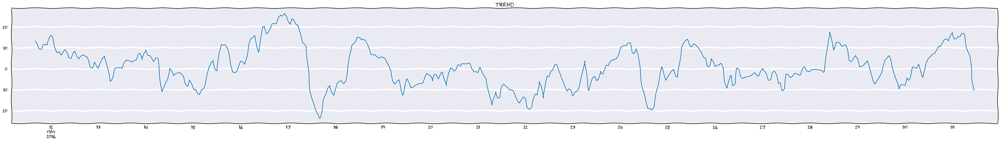

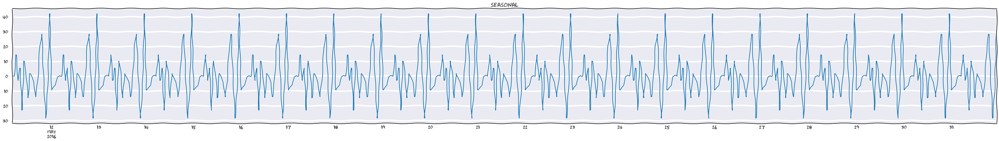

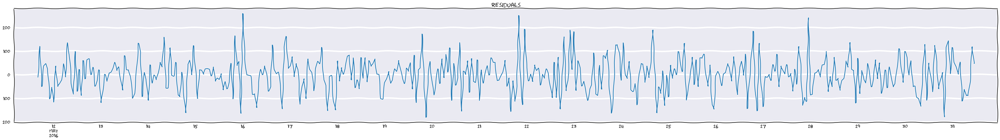

In [89]:
index=[pd.to_datetime(tt) for tt in ESB_ts.index[-500:]]
ts_resids= pd.Series(model.model.resid[-500:],index=index)
stl_plot(ts_resids)

Можно заметить, что ряд остатков скорее нестационарен в связи с тем, что небольшие тренды и суточная сезонность осталась, хотя ряд уже больше напоминает что-то хаотическое визуально. С этим, скорее всего, связана слабая автокоррелированность ряда. Посмотрим, как модель ведет себя на валидации.

In [0]:
prediction = model.predict(ESB_ts.shape[0]-719,ESB_ts.shape[0])

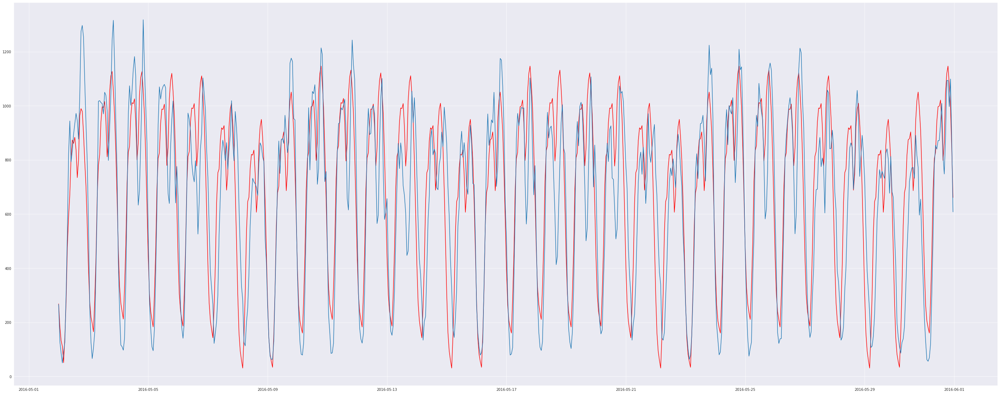

In [94]:
plt.figure(figsize=(50,20))
plt.plot(ESB_ts[-720:].index,prediction,color='r')
plt.plot(ESB_ts[-720:].index,ESB_ts[-720:].values);

Точность на данных за май несколько хуже, чем на обучении. Нужно также учитывать, что обучение происходило на данных за 5 месяцев, при этом не учитываются особенности месяцев в году, то есть годовая сезонность. В качестве улучшения, можно попробовать итерационно описывать остатки данного шага снова моделью ARIMA и просто добавлять результат при предсказании.